## Importing Libraries

In [2]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [88]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
import xgboost
from xgboost import XGBClassifier
from sklearn.feature_selection import RFECV
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score,precision_score, recall_score, accuracy_score
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.metrics import roc_curve, roc_auc_score

## Data Preprocessing

In [5]:
df1 = pd.read_hdf("C:/Users/saipr/Downloads/dftrain.h5")
df2 = pd.read_hdf("C:/Users/saipr/Downloads/dfvalid.h5")
df3 = pd.read_csv("C:/Users/saipr/Downloads/dfvalid_groundtruth.csv")
df1["anomaly"] = 0.0
df4  = pd.concat([df2,df3["anomaly"]],axis = 1)
df5 = pd.concat([df1,df4], axis = 0)

In [6]:
df5

,0,1,2,3,4,5,6,7,8,9,...,61431,61432,61433,61434,61435,61436,61437,61438,61439,anomaly
0,0.041259,0.041259,0.032573,0.023887,0.029315,0.041259,0.045602,0.038001,0.030401,0.032573,...,-0.007600,-0.003257,0.065145,0.047773,-0.009772,0.031487,0.096632,0.077089,0.040173,0.0
1,-0.211722,-0.264924,-0.274696,-0.236694,-0.156349,-0.059716,0.005429,0.046687,0.153091,0.281210,...,-0.004343,-0.241037,-0.636252,-0.953292,-0.980436,-0.846888,-0.838202,-0.880546,-0.739398,0.0
2,0.214105,0.154930,0.136640,0.013987,-0.038733,-0.015063,-0.111894,-0.104363,0.047340,-0.054871,...,0.375490,0.699337,0.965085,1.086662,1.132926,1.279249,1.296464,0.937112,0.451879,0.0
3,-0.154837,-0.127768,-0.217638,-0.284770,-0.299929,-0.270694,-0.077960,0.092036,0.076877,0.154837,...,-0.171079,-0.036814,-0.024904,0.031400,0.140761,-0.011911,-0.173244,-0.063884,0.081208,0.0
4,-1.022780,-0.916376,-0.676425,-0.461445,-0.330069,-0.122690,0.178064,0.489675,0.799115,0.931577,...,1.134613,0.836030,0.479903,0.109661,-0.285553,-0.628651,-0.916376,-1.010837,-0.804544,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,-18.291415,-18.288957,-18.285270,-18.282812,-18.280354,-18.276668,-18.271752,-18.268065,-18.268065,-18.270523,...,-19.514201,-19.515430,-19.514201,-19.511744,-19.506828,-19.501912,-19.496996,-19.493310,-19.490852,1.0
590,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,...,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,1.0
591,0.031800,-0.143735,-0.059784,0.248039,0.283655,-0.010176,-0.153911,0.069960,0.283655,0.183167,...,0.151367,0.166631,0.171719,0.153911,0.160271,0.141191,0.050880,-0.020352,0.025440,0.0
592,-0.026635,-0.026635,-0.006721,0.009210,-0.008464,-0.036094,-0.039082,-0.026137,-0.017674,-0.017674,...,0.103802,0.104798,0.094841,0.073184,0.058747,0.062978,0.081399,0.103056,0.113760,0.0


In [7]:
X = df5.iloc[:,0:61440]
Y = df5.iloc[:,61440]

In [8]:
X

,0,1,2,3,4,5,6,7,8,9,...,61430,61431,61432,61433,61434,61435,61436,61437,61438,61439
0,0.041259,0.041259,0.032573,0.023887,0.029315,0.041259,0.045602,0.038001,0.030401,0.032573,...,0.034744,-0.007600,-0.003257,0.065145,0.047773,-0.009772,0.031487,0.096632,0.077089,0.040173
1,-0.211722,-0.264924,-0.274696,-0.236694,-0.156349,-0.059716,0.005429,0.046687,0.153091,0.281210,...,0.260581,-0.004343,-0.241037,-0.636252,-0.953292,-0.980436,-0.846888,-0.838202,-0.880546,-0.739398
2,0.214105,0.154930,0.136640,0.013987,-0.038733,-0.015063,-0.111894,-0.104363,0.047340,-0.054871,...,0.040884,0.375490,0.699337,0.965085,1.086662,1.132926,1.279249,1.296464,0.937112,0.451879
3,-0.154837,-0.127768,-0.217638,-0.284770,-0.299929,-0.270694,-0.077960,0.092036,0.076877,0.154837,...,-0.286936,-0.171079,-0.036814,-0.024904,0.031400,0.140761,-0.011911,-0.173244,-0.063884,0.081208
4,-1.022780,-0.916376,-0.676425,-0.461445,-0.330069,-0.122690,0.178064,0.489675,0.799115,0.931577,...,1.009751,1.134613,0.836030,0.479903,0.109661,-0.285553,-0.628651,-0.916376,-1.010837,-0.804544
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,-18.291415,-18.288957,-18.285270,-18.282812,-18.280354,-18.276668,-18.271752,-18.268065,-18.268065,-18.270523,...,-19.514201,-19.514201,-19.515430,-19.514201,-19.511744,-19.506828,-19.501912,-19.496996,-19.493310,-19.490852
590,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,...,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138,-13.352138
591,0.031800,-0.143735,-0.059784,0.248039,0.283655,-0.010176,-0.153911,0.069960,0.283655,0.183167,...,0.185711,0.151367,0.166631,0.171719,0.153911,0.160271,0.141191,0.050880,-0.020352,0.025440
592,-0.026635,-0.026635,-0.006721,0.009210,-0.008464,-0.036094,-0.039082,-0.026137,-0.017674,-0.017674,...,0.104549,0.103802,0.104798,0.094841,0.073184,0.058747,0.062978,0.081399,0.103056,0.113760


In [9]:
# check for stationarity
from statsmodels.tsa.stattools import adfuller

result = adfuller(X[100])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
for key, value in result[4].items():
    print(f'Critical Value ({key}): {value}')

if result[1] < 0.05:
    print("The time series is stationary (reject null hypothesis).")
else:
    print("The time series is non-stationary (fail to reject null hypothesis).")


ADF Statistic: -4.223159480632307
p-value: 0.0006018816414948618
Critical Value (1%): -3.433267467097435
Critical Value (5%): -2.862828856845257
Critical Value (10%): -2.567456119332679
The time series is stationary (reject null hypothesis).


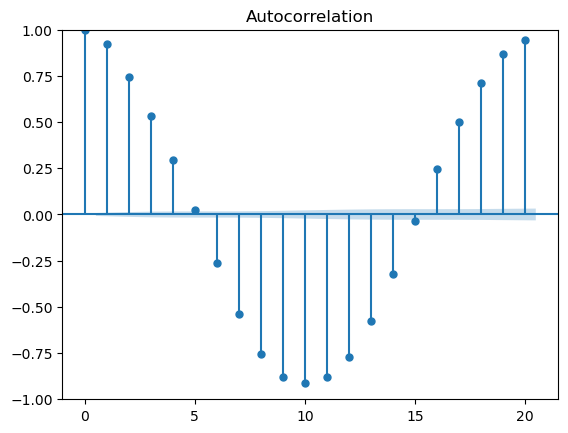

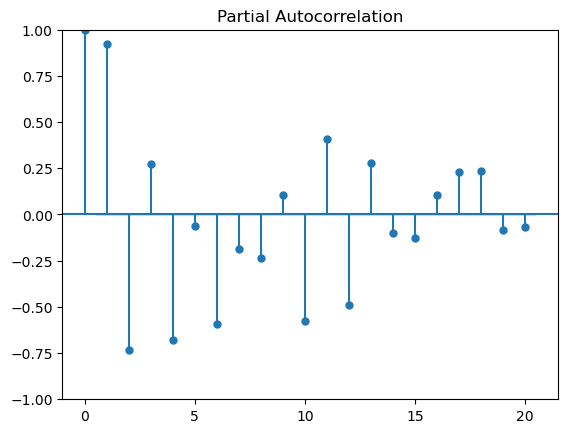

In [10]:
# Plot ACF and PACF
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
data = df5.iloc[7, :-1]  
plot_acf(data, lags=20)
plot_pacf(data, lags=20)
plt.show()

Text(0.5, 1.0, 'First 5 accelerometer measurements vs time')

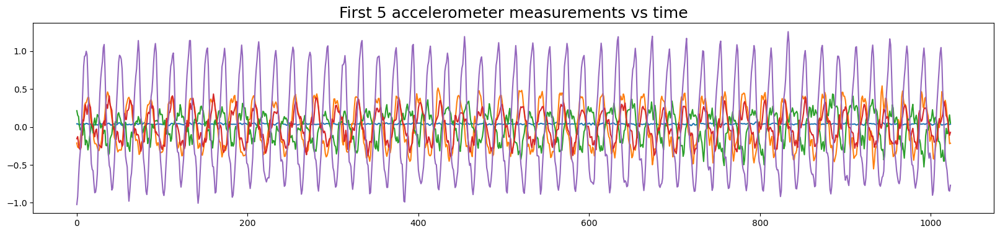

In [11]:
#Plot accelerometer measurements
import matplotlib.pyplot as plt
plt.figure(figsize=(20,4))
for i in range(0,5):
      plt.plot(X.iloc[i][:1024])
plt.title("First 5 accelerometer measurements vs time", fontsize=18)

## Feature Extraction

In [13]:
sc = StandardScaler()
X = sc.fit_transform(X)

In [14]:
pca = PCA(n_components=5)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal_component_1', 'principal _component_2','principal _component_3','principal_component_4','principal _component_5'])


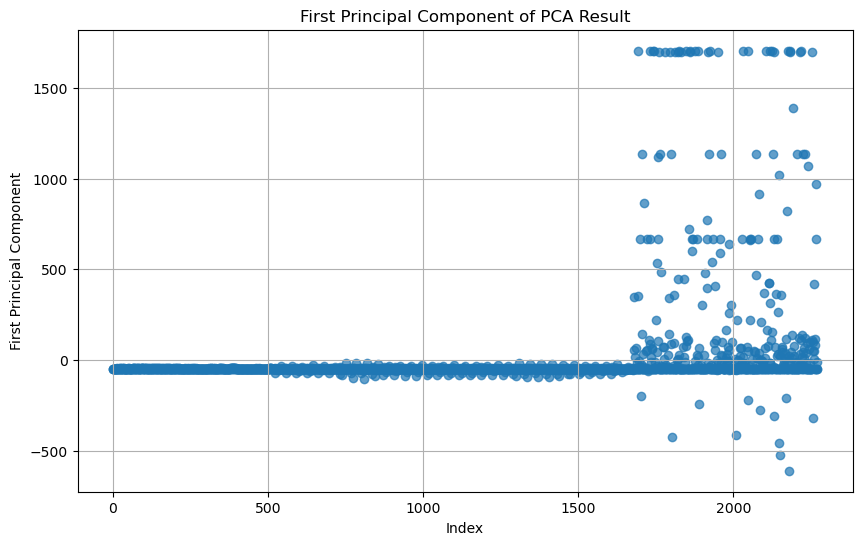

In [15]:
plt.figure(figsize=(10, 6))
plt.scatter(range(len(principalComponents)), principalComponents[:, 0], alpha=0.7)
plt.xlabel('Index')
plt.ylabel('First Principal Component')
plt.title('First Principal Component of PCA Result')
plt.grid()
plt.show()

In [16]:
# Time domain feature extraction
import numpy as np
import pandas as pd
from scipy.stats import skew, kurtosis
from statsmodels.tsa.stattools import acf

def calculate_rms(series):
    return np.sqrt(np.mean(series**2))

def zero_crossing_rate(series):
    return np.mean(np.diff(np.sign(series)) != 0)

def extract_features(df, max_lag=5):
    features = pd.DataFrame()
    
    for i in range(len(df)):
        series = df.iloc[i, :-1]
        features.loc[i, 'mean'] = np.mean(series)
        features.loc[i, 'std_dev'] = np.std(series)
        features.loc[i, 'variance'] = np.var(series)
        features.loc[i, 'min'] = np.min(series)
        features.loc[i, 'max'] = np.max(series)
        
        # Check for variance to avoid precision loss
        if np.var(series) > 1e-6: 
            features.loc[i, 'skewness'] = skew(series)
            features.loc[i, 'kurtosis'] = kurtosis(series)
        else:
            features.loc[i, 'skewness'] = np.nan
            features.loc[i, 'kurtosis'] = np.nan
        
        features.loc[i, 'rms'] = calculate_rms(series)
        features.loc[i, 'zero_crossing_rate'] = zero_crossing_rate(series)
        
        
        acf_values = acf(series, nlags=max_lag)
        for lag in range(1, max_lag + 1):
            features.loc[i, f'acf_lag_{lag}'] = acf_values[lag]

    return features


In [17]:
df6 = extract_features(df5)

C:\Users\saipr\anaconda1\Lib\site-packages\statsmodels\tsa\stattools.py:693: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


In [18]:
df6

,mean,std_dev,variance,min,max,skewness,kurtosis,rms,zero_crossing_rate,acf_lag_1,acf_lag_2,acf_lag_3,acf_lag_4,acf_lag_5
0,0.039373,2.491832e-02,6.209227e-04,-0.247552,0.299668,-0.040011,13.576538,0.046595,0.054558,0.349354,-0.515668,-0.271193,0.418513,0.299613
1,0.003725,6.955411e-01,4.837774e-01,-1.295304,1.423423,0.054604,-1.407148,0.695551,0.099481,0.942218,0.788687,0.571775,0.309424,0.015905
2,0.012775,8.523059e-01,7.264254e-01,-1.745115,1.748343,0.002215,-1.314112,0.852402,0.100799,0.946267,0.799262,0.582388,0.312964,0.011696
3,0.004919,1.450451e-01,2.103809e-02,-0.748198,0.717880,-0.010889,0.574289,0.145128,0.287423,0.657896,0.075473,-0.203172,-0.157061,0.019005
4,0.032258,6.560128e-01,4.303528e-01,-1.213873,1.402794,0.118326,-1.416828,0.656805,0.100897,0.938372,0.776316,0.552695,0.290667,0.005508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2266,-19.002274,3.284267e-01,1.078641e-01,-19.527720,-18.198016,0.476697,-0.602986,19.005112,0.000000,0.999908,0.999758,0.999567,0.999356,0.999141
2267,-13.352138,9.206857e-12,8.476622e-23,-13.352138,-13.352138,NaN,NaN,13.352138,0.000000,0.999984,0.999967,0.999951,0.999935,0.999919
2268,0.038360,2.244087e-01,5.035926e-02,-2.068262,2.161117,0.134298,1.353647,0.227664,0.377073,0.383868,-0.393543,-0.106770,0.492686,0.316379
2269,-0.003565,7.246413e-02,5.251050e-03,-0.275064,0.192171,-0.359304,-0.142374,0.072552,0.060532,0.983335,0.948735,0.913358,0.872998,0.823664


In [19]:
# Time domain feature extraction
import numpy as np
import pandas as pd

def extract_frequency_features(df, sampling_rate=1024):
    features = pd.DataFrame()
    n = 61440 

    for i in range(len(df)):
        series = df.iloc[i, :-1]
        
        # Perform FFT and compute the magnitude of positive frequencies
        fft_values = np.fft.fft(series)
        fft_magnitude = np.abs(fft_values[:n//2])
        freqs = np.fft.fftfreq(n, d=1/sampling_rate)[:n//2]

        # Extract frequency-domain features
        features.loc[i, 'dominant_freq'] = freqs[np.argmax(fft_magnitude)]
        features.loc[i, 'total_power'] = np.sum(fft_magnitude ** 2)
        features.loc[i, 'spectral_entropy'] = -np.sum((fft_magnitude/np.sum(fft_magnitude)) * 
                                                      np.log(fft_magnitude/np.sum(fft_magnitude) + 1e-12))
        features.loc[i, 'freq_variance'] = np.var(fft_magnitude)
    
    return features


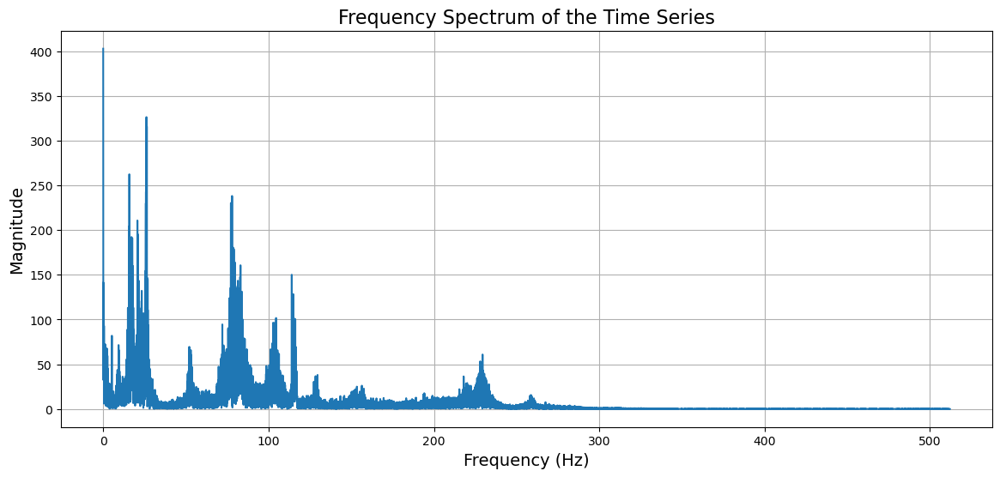

In [20]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
sampling_rate = 1024  
n = 60 * sampling_rate  


series = df5.iloc[2200, :-1]  

# Apply FFT
fft_values = np.fft.fft(series)
fft_magnitude = np.abs(fft_values[:n // 2])  # Magnitude of positive frequencies
freqs = np.fft.fftfreq(n, d=1 / sampling_rate)[:n // 2]  # Frequency values for positive part

# Plotting the spectrum
plt.figure(figsize=(14, 6))
plt.plot(freqs, fft_magnitude)
plt.title("Frequency Spectrum of the Time Series", fontsize=16)
plt.xlabel("Frequency (Hz)", fontsize=14)
plt.ylabel("Magnitude", fontsize=14)
plt.grid(True)
plt.show()


In [21]:
df7 = extract_frequency_features(df5)

C:\Users\saipr\AppData\Local\Temp\ipykernel_10256\412110675.py:20: RuntimeWarning: invalid value encountered in divide
  features.loc[i, 'spectral_entropy'] = -np.sum((fft_magnitude/np.sum(fft_magnitude)) *
C:\Users\saipr\AppData\Local\Temp\ipykernel_10256\412110675.py:21: RuntimeWarning: invalid value encountered in divide
  np.log(fft_magnitude/np.sum(fft_magnitude) + 1e-12))


In [22]:
df7

,dominant_freq,total_power,spectral_entropy,freq_variance
0,0.000000,7.023764e+06,9.571787e+00,2.135479e+02
1,50.916667,9.131516e+08,8.617436e+00,2.924732e+04
2,50.916667,1.371698e+09,8.565544e+00,4.408112e+04
3,152.733333,3.979939e+07,9.576466e+00,9.825270e+02
4,50.916667,8.161917e+08,8.637353e+00,2.609902e+04
...,...,...,...,...
2266,0.000000,1.363259e+12,1.119587e+00,4.437512e+07
2267,0.000000,6.729830e+11,-1.000089e-12,2.190628e+07
2268,0.000000,1.006048e+08,9.406720e+00,2.460729e+03
2269,9.816667,9.959000e+06,8.918186e+00,3.132188e+02


In [23]:
df6 = df6.reset_index(drop=True)
df7 = df7.reset_index(drop=True)
principalDf = principalDf.reset_index(drop=True)
Y = Y.reset_index(drop=True)

## EDA

In [25]:
df8 = pd.concat([df6,df7,principalDf,Y],axis = 1)

In [26]:
df8.columns

Index(['mean', 'std_dev', 'variance', 'min', 'max', 'skewness', 'kurtosis',
       'rms', 'zero_crossing_rate', 'acf_lag_1', 'acf_lag_2', 'acf_lag_3',
       'acf_lag_4', 'acf_lag_5', 'dominant_freq', 'total_power',
       'spectral_entropy', 'freq_variance', 'principal_component_1',
       'principal _component_2', 'principal _component_3',
       'principal_component_4', 'principal _component_5', 'anomaly'],
      dtype='object')

In [27]:
df8.dtypes

mean                      float64
std_dev                   float64
variance                  float64
min                       float64
max                       float64
skewness                  float64
kurtosis                  float64
rms                       float64
zero_crossing_rate        float64
acf_lag_1                 float64
acf_lag_2                 float64
acf_lag_3                 float64
acf_lag_4                 float64
acf_lag_5                 float64
dominant_freq             float64
total_power               float64
spectral_entropy          float64
freq_variance             float64
principal_component_1     float64
principal _component_2    float64
principal _component_3    float64
principal_component_4     float64
principal _component_5    float64
anomaly                   float64
dtype: object

In [28]:
df8.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2271 entries, 0 to 2270
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   mean                    2271 non-null   float64
 1   std_dev                 2271 non-null   float64
 2   variance                2271 non-null   float64
 3   min                     2271 non-null   float64
 4   max                     2271 non-null   float64
 5   skewness                2243 non-null   float64
 6   kurtosis                2243 non-null   float64
 7   rms                     2271 non-null   float64
 8   zero_crossing_rate      2271 non-null   float64
 9   acf_lag_1               2270 non-null   float64
 10  acf_lag_2               2270 non-null   float64
 11  acf_lag_3               2270 non-null   float64
 12  acf_lag_4               2270 non-null   float64
 13  acf_lag_5               2270 non-null   float64
 14  dominant_freq           2271 non-null   

In [29]:
df8.describe()

,mean,std_dev,variance,min,max,skewness,kurtosis,rms,zero_crossing_rate,acf_lag_1,...,dominant_freq,total_power,spectral_entropy,freq_variance,principal_component_1,principal _component_2,principal _component_3,principal_component_4,principal _component_5,anomaly
count,2271.000000,2271.000000,2271.000000,2271.000000,2271.000000,2243.000000,2243.000000,2271.000000,2271.000000,2270.000000,...,2271.000000,2.271000e+03,2.270000e+03,2.271000e+03,2271.000000,2.271000e+03,2.271000e+03,2.271000e+03,2.271000e+03,2271.000000
mean,-0.913046,0.652523,1.043465,-3.664641,1.446270,-0.062805,0.194985,1.552305,0.180966,0.773797,...,44.176046,8.207741e+10,8.951901e+00,2.662048e+06,0.000000,-7.008436e-16,1.251506e-17,3.441642e-16,-4.505423e-16,0.130779
std,4.516269,0.786098,4.645577,5.720330,5.206173,0.370618,1.686842,4.456895,0.097614,0.174200,...,48.861613,4.966781e+11,1.679480e+00,1.616672e+07,241.823156,1.602795e+01,9.148649e+00,8.809442e+00,8.295560e+00,0.337233
min,-32.763225,0.000000,0.000000,-35.742439,-32.692194,-4.558897,-1.477164,0.000000,0.000000,-0.297708,...,0.000000,0.000000e+00,-1.000089e-12,0.000000e+00,-610.552741,-1.773331e+02,-1.082832e+02,-2.002567e+02,-1.091465e+02,0.000000
25%,-0.035373,0.168788,0.028489,-3.614010,0.724685,-0.120889,-0.417593,0.192138,0.108360,0.701528,...,0.000000,7.549737e+07,9.116283e+00,2.059696e+03,-49.710817,-4.479483e-01,-5.282594e-01,-7.642588e-02,-2.946057e-01,0.000000
50%,-0.001211,0.474549,0.225196,-1.967595,1.705239,-0.009547,-0.080605,0.548866,0.182978,0.793103,...,43.333333,5.905433e+08,9.341447e+00,1.639586e+04,-48.819888,-8.219172e-02,-2.428916e-01,7.971063e-03,-2.314192e-01,0.000000
75%,0.015323,0.851059,0.724301,-0.771413,3.125736,0.081349,0.254982,0.975513,0.238562,0.897928,...,55.766667,1.910466e+09,9.497900e+00,5.467011e+04,-46.989775,2.426840e-01,7.949502e-02,1.131517e-01,-1.460487e-01,0.000000
max,10.489094,12.393590,153.601072,9.714832,17.914855,1.706769,29.511318,32.763230,0.617425,0.999984,...,342.200000,4.052059e+12,9.937420e+00,1.318983e+08,1705.461507,6.367571e+02,2.442249e+02,2.817434e+02,3.163101e+02,1.000000


In [30]:
df8.isna().sum()

mean                       0
std_dev                    0
variance                   0
min                        0
max                        0
skewness                  28
kurtosis                  28
rms                        0
zero_crossing_rate         0
acf_lag_1                  1
acf_lag_2                  1
acf_lag_3                  1
acf_lag_4                  1
acf_lag_5                  1
dominant_freq              0
total_power                0
spectral_entropy           1
freq_variance              0
principal_component_1      0
principal _component_2     0
principal _component_3     0
principal_component_4      0
principal _component_5     0
anomaly                    0
dtype: int64

In [31]:
df8 = df8.fillna(0)

In [32]:
df8.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2266    False
2267     True
2268    False
2269    False
2270    False
Length: 2271, dtype: bool

In [33]:
df8.drop_duplicates(inplace = True)

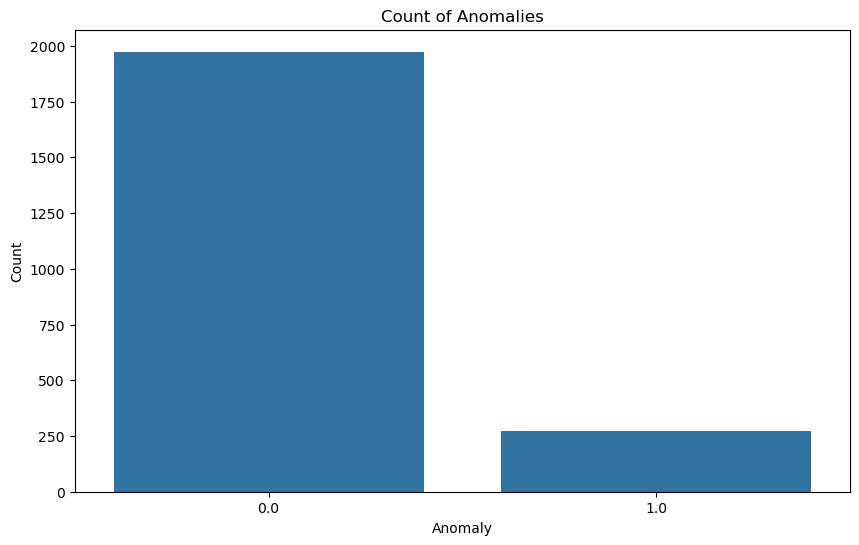

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.countplot(x='anomaly', data=df8)
plt.xlabel('Anomaly')
plt.ylabel('Count')
plt.title('Count of Anomalies')
plt.show()

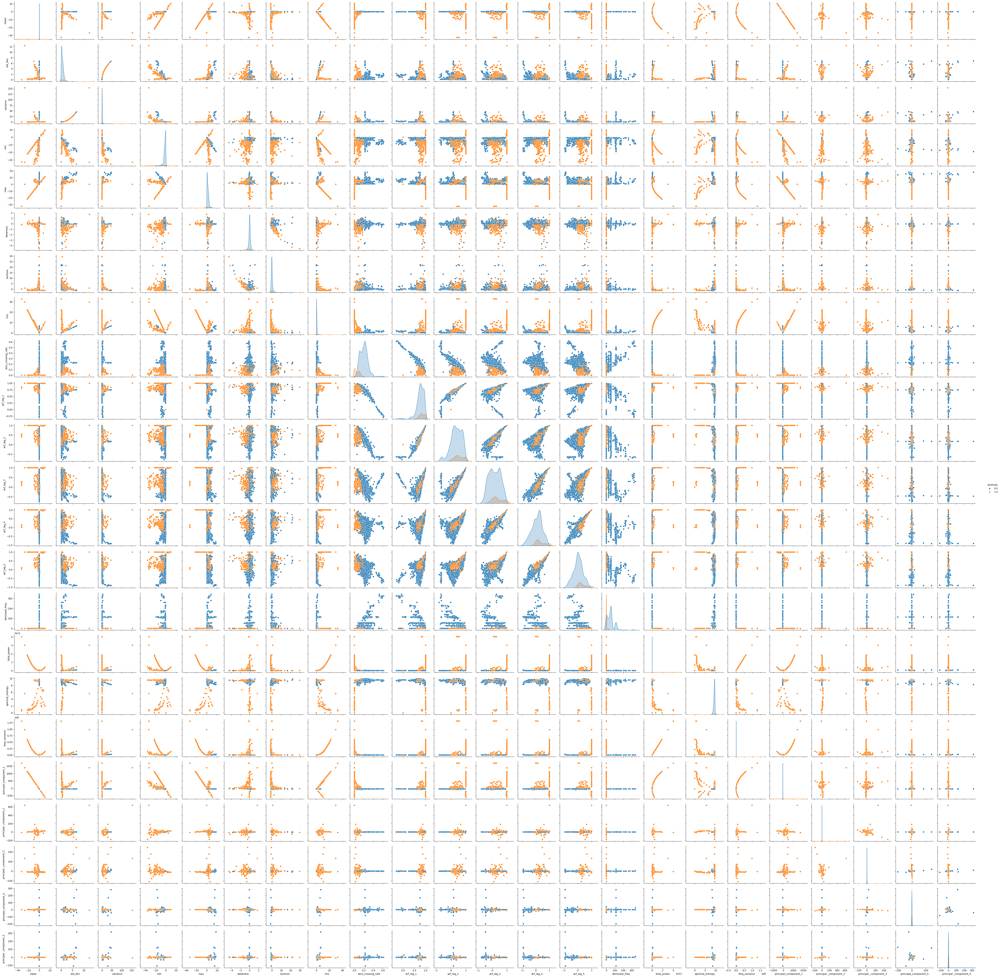

In [35]:
import seaborn as sns
sns.pairplot(df8,hue="anomaly")

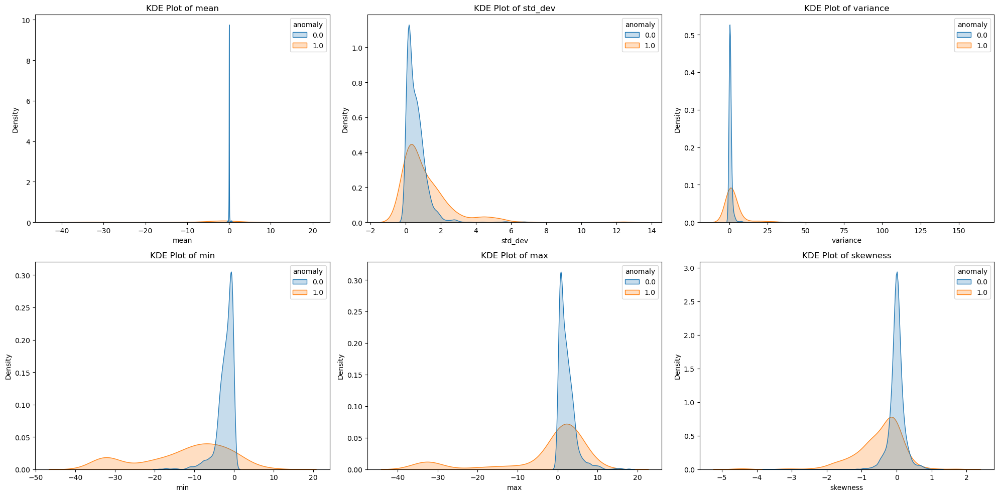

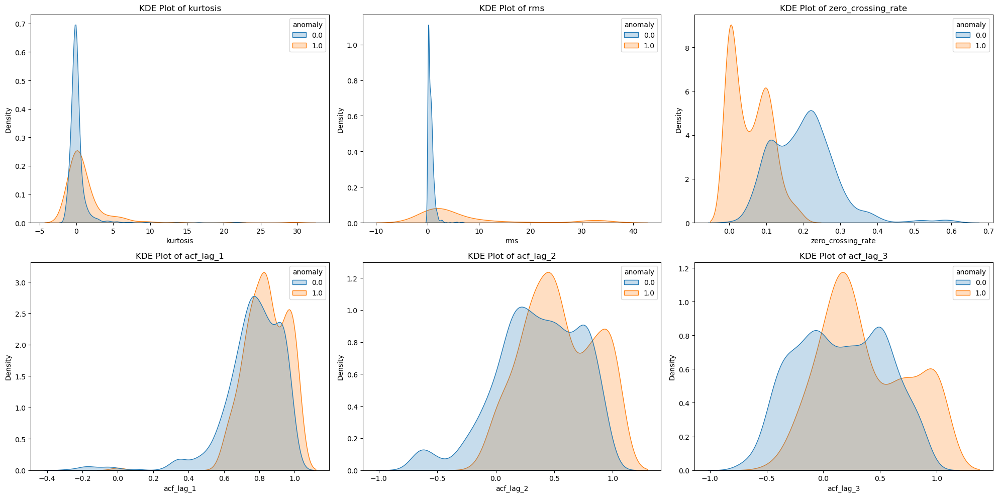

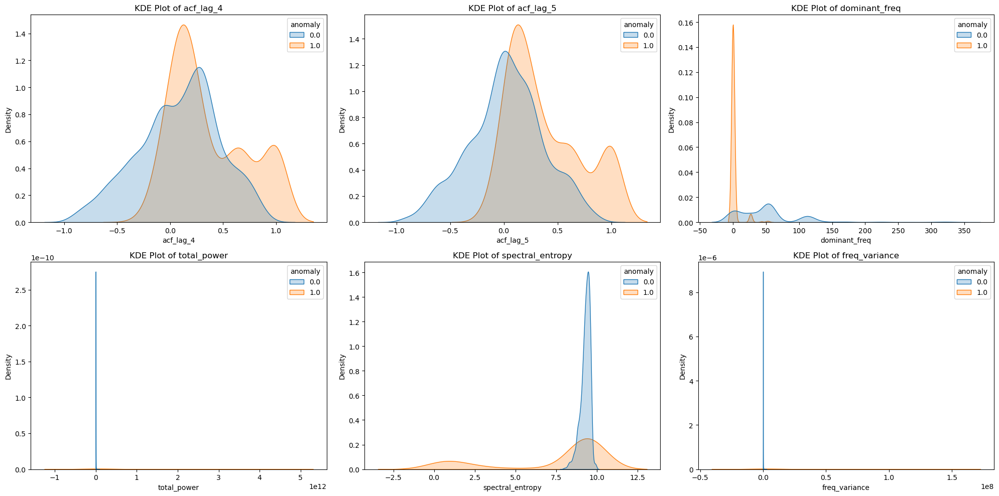

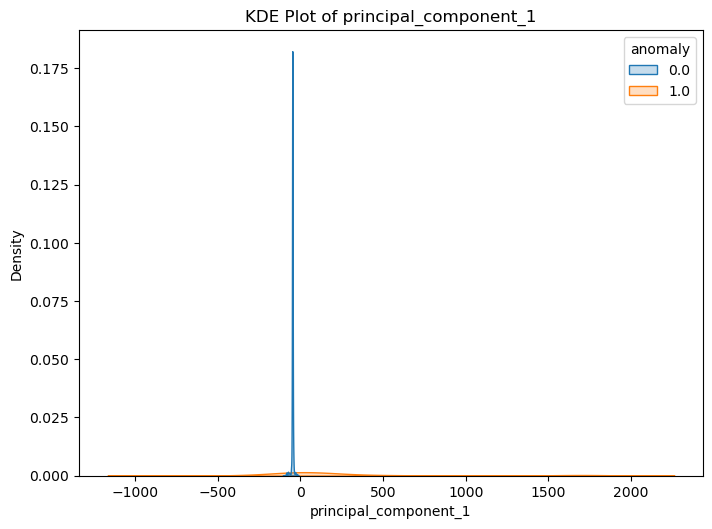

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt


features = ['mean', 'std_dev', 'variance', 'min', 'max', 'skewness', 'kurtosis',
            'rms', 'zero_crossing_rate', 'acf_lag_1', 'acf_lag_2', 'acf_lag_3',
            'acf_lag_4', 'acf_lag_5', 'dominant_freq', 'total_power',
            'spectral_entropy', 'freq_variance', 'principal_component_1']


batch_size = 6  


for start in range(0, len(features), batch_size):
    end = start + batch_size
    plt.figure(figsize=(20, 10))

    # Create KDE plots for the current batch of features
    for i, feature in enumerate(features[start:end]):
        plt.subplot(2, 3, i + 1)  
        sns.kdeplot(data=df8, x=feature, hue='anomaly', fill=True, common_norm=False)
        plt.title(f'KDE Plot of {feature}')
        plt.xlabel(feature)
        plt.ylabel('Density')

    plt.tight_layout()
    plt.show()


<Axes: >

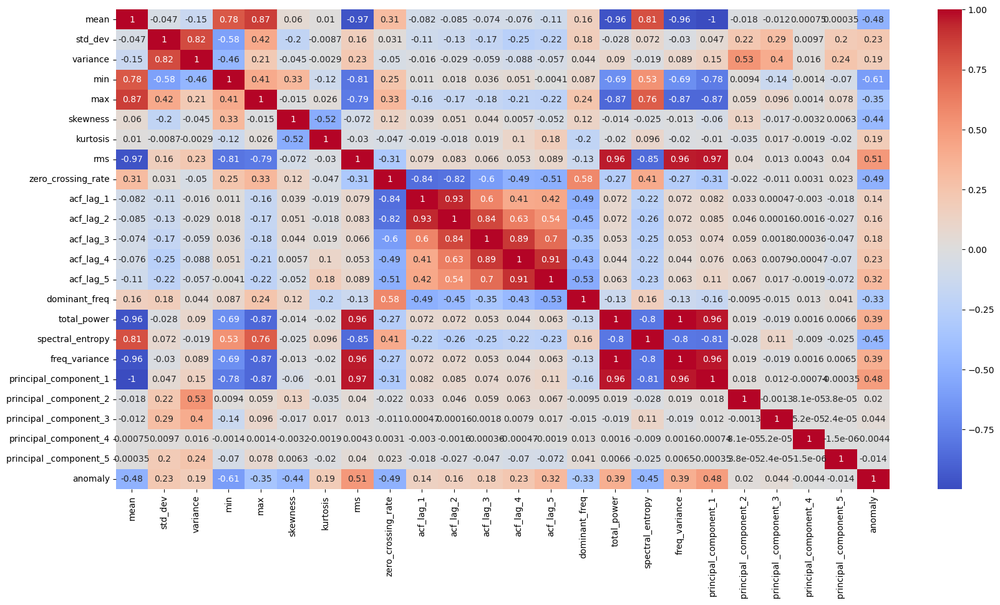

In [37]:
plt.figure(figsize=(20, 10))
sns.heatmap(df8.corr(), annot=True, cmap='coolwarm')

## Model fitting and Evaluation

In [39]:
x = df8[['mean', 'std_dev', 'variance', 'min', 'max', 'skewness', 'kurtosis',
       'rms', 'zero_crossing_rate', 'acf_lag_1', 'acf_lag_2', 'acf_lag_3',
       'acf_lag_4', 'acf_lag_5', 'dominant_freq', 'total_power',
       'spectral_entropy', 'freq_variance', 'principal_component_1',
       'principal _component_2', 'principal _component_3',
       'principal_component_4', 'principal _component_5' ]]
y = df8['anomaly']

In [40]:
df8.iloc[:,23]

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
2265    0.0
2266    1.0
2268    0.0
2269    0.0
2270    1.0
Name: anomaly, Length: 2246, dtype: float64

In [41]:
le = LabelEncoder()
y= le.fit_transform(y)
y

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [42]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,train_size = 0.8)

In [43]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

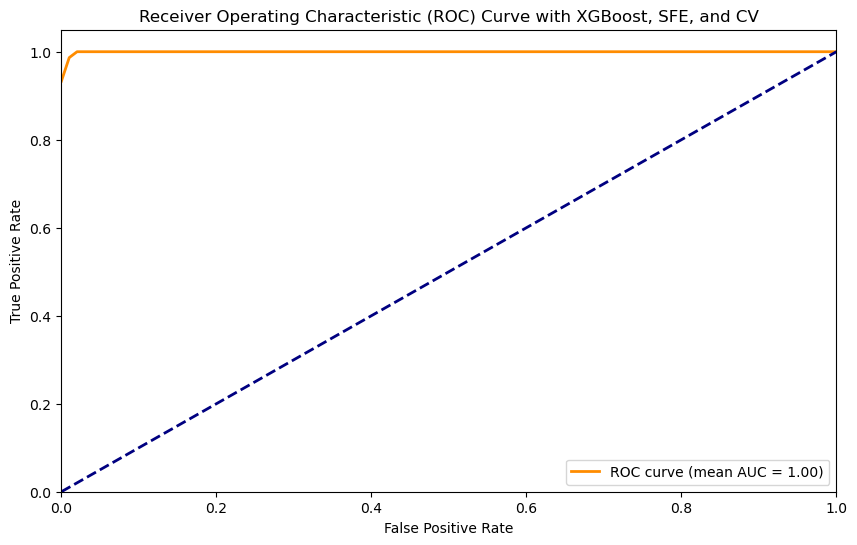

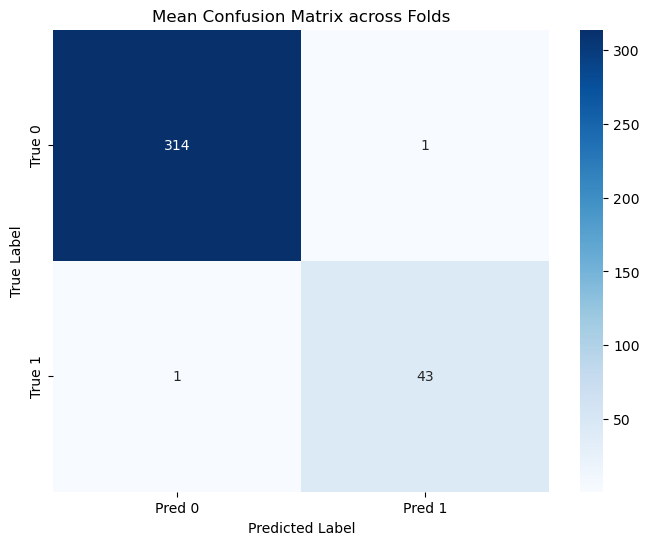

Mean Accuracy: 0.99
Mean Precision: 0.98
Mean Recall: 0.97
Mean ROC AUC: 1.00


In [90]:
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, accuracy_score, precision_score, recall_score
from sklearn.feature_selection import RFECV
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Initialize the cross-validation and model
cv = StratifiedKFold(n_splits=5)
model = xgb.XGBClassifier()
rfe_cv = RFECV(estimator=model, step=1, cv=cv, scoring='accuracy')
pipeline = Pipeline(steps=[('s', rfe_cv), ('m', model)])

# Lists to store metrics for each fold
fpr_all = []
tpr_all = []
roc_auc_all = []
conf_matrices = []  # To store confusion matrices for each fold
accuracy_all = []
precision_all = []
recall_all = []

# Cross-validation loop
for train_index, test_index in cv.split(x_train, y_train):
    X_train, X_test = x_train.iloc[train_index], x_train.iloc[test_index] 
    y_train_fold, y_test_fold = y_train[train_index], y_train[test_index]  
    pipeline.fit(X_train, y_train_fold)
    
    # Predict probabilities and labels
    y_prob = pipeline.predict_proba(X_test)[:, 1]
    y_pred = pipeline.predict(X_test)

    # Calculate ROC AUC
    fpr, tpr, _ = roc_curve(y_test_fold, y_prob)
    roc_auc = roc_auc_score(y_test_fold, y_prob)

    # Append ROC AUC metrics
    fpr_all.append(fpr)
    tpr_all.append(tpr)
    roc_auc_all.append(roc_auc)
    
    # Calculate confusion matrix, accuracy, precision, and recall
    cm = confusion_matrix(y_test_fold, y_pred)
    accuracy = accuracy_score(y_test_fold, y_pred)
    precision = precision_score(y_test_fold, y_pred)
    recall = recall_score(y_test_fold, y_pred)

    
    conf_matrices.append(cm)
    accuracy_all.append(accuracy)
    precision_all.append(precision)
    recall_all.append(recall)

# Calculate the mean ROC curve
mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.mean([np.interp(mean_fpr, fpr, tpr) for fpr, tpr in zip(fpr_all, tpr_all)], axis=0)
mean_roc_auc = np.mean(roc_auc_all)

# Plot the AUC-ROC curve
plt.figure(figsize=(10, 6))
plt.plot(mean_fpr, mean_tpr, color='darkorange', lw=2, label='ROC curve (mean AUC = %0.2f)' % mean_roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve with XGBoost, SFE, and CV')
plt.legend(loc="lower right")
plt.show()

# Aggregate confusion matrices and plot the average
mean_cm = np.mean(conf_matrices, axis=0)
plt.figure(figsize=(8, 6))
sns.heatmap(mean_cm, annot=True, fmt=".0f", cmap="Blues", xticklabels=["Pred 0", "Pred 1"], yticklabels=["True 0", "True 1"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Mean Confusion Matrix across Folds")
plt.show()

# Print average metrics across folds
print(f"Mean Accuracy: {np.mean(accuracy_all):.2f}")
print(f"Mean Precision: {np.mean(precision_all):.2f}")
print(f"Mean Recall: {np.mean(recall_all):.2f}")
print(f"Mean ROC AUC: {mean_roc_auc:.2f}")
